In [ ]:
import matplotlib.pyplot as plt # plotting library
import numpy as np # this module is useful to work with numerical arrays
import pandas as pd 
import random 
import torch
import torchvision
from torchvision import transforms
import torch.utils.data as Data
from torch.utils.data import DataLoader,random_split
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
from tqdm import tqdm
from sklearn.manifold import TSNE
import plotly.express as px
import tensorflow as tf
from torch import distributions as D
from torch.distributions.mixture_same_family import MixtureSameFamily

In [ ]:
# tf.keras.datasets.mnist.load_data(path="mnist.npz")
(X_train, y_train), (X_test, y_test) = tf.keras.datasets.mnist.load_data()
X_train = X_train.astype("float32").reshape(-1, 784)/255
X_test = X_test.astype("float32").reshape(-1, 784)/255

In [ ]:
X_train = torch.tensor(X_train)
y_train = torch.tensor(y_train)
X_test = torch.tensor(X_test)
y_test = torch.tensor(y_test)

batch_size = 1000

train_dataset = Data.TensorDataset(X_train, y_train)
m = len(train_dataset)
train_dataset, val_dataset = random_split(train_dataset, [int(m-m*0.2), int(m*0.2)])
train_dataloader = Data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = Data.DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_dataset = Data.TensorDataset(X_test, y_test)
test_dataloader = Data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
mu = torch.tensor([[ 100.5407, -10.0915],
        [ 90.3313,  90.1965],
        [10.9460,  100.2261],
        [-30.4957,  10.4484],
        [100.0901, -90.3533],
        [-100.2582,  0.2463],
        [ -100.2725,  -100.5929],
        [ -10.7310, -100.4986],
        [-50.8394,  100.6549],
        [ 30.4946, -30.6491]])
var = torch.tensor([[1., 1.],
        [1., 1.],
        [1., 1.],
        [1., 1.],
        [1., 1.],
        [1., 1.],
        [1., 1.],
        [1., 1.],
        [1., 1.],
        [1., 1.]])
# var = torch.rand(10,2)
# var

In [ ]:
def Gaussian_mix_2d(classes=10, dim=2, mu=mu, var=var):
  mix = D.Categorical(torch.ones(classes,))
  comp = D.Independent(D.Normal(mu, var), 1)
  gmm = MixtureSameFamily(mix, comp)
  return gmm

In [ ]:
def Gaussian_mix_2d(classes=10, dim=2):
  mix = D.Categorical(torch.ones(classes,))
  comp = D.Independent(D.Normal(
      torch.randn(classes,dim), torch.rand(classes,dim)), 1)
  gmm = MixtureSameFamily(mix, comp)
  return gmm

In [ ]:
class Regularizer():
    def __init__(self, scale=1., ksize=100):
        super(Regularizer, self).__init__()
        self.scale = scale
#         self.distribution = distribution
        self.ksize = ksize
    
    def get_kernel(self, X, Z):
#         print((torch.unsqueeze(X, dim=1).shape))
#         print(Z.shape)
#         print((torch.unsqueeze(X, dim=1) - Z).shape)
#         print((torch.unsqueeze(X, dim=1) - Z))
        X = X.to(device)
        Z = Z.to(device)
        G = torch.sum((torch.unsqueeze(X, dim=1) - Z)**2, axis=-1)
        # print(G)
        # print(len(G))
        # G = torch.exp(-G/(2*(self.ksize))) / np.sqrt(2*np.pi*self.ksize)
        G = torch.exp(-G/(2*(self.ksize**2))) / (np.sqrt(2*np.pi)*self.ksize)
        return G

In [ ]:
class Encoder(nn.Module):
    def __init__(self, latent_dims):
        super(Encoder, self).__init__()
        self.linear1 = nn.Linear(784, 800)
        self.linear2 = nn.Linear(800, 400)
        self.linear3 = nn.Linear(400, latent_dims)
        # self.linear4 = nn.Linear(400, latent_dims)
#         self.N = normal_distribution((1000, 3))
        # self.N = torch.distributions.Normal(0, 5)
        # self.S = swiss_roll(1000)
        self.csd = 0
        
    def forward(self, x):
        x = x.to(device)
#         x = torch.flatten(x, 1)
        x = F.tanh(self.linear1(x))
        x = F.tanh(self.linear2(x))
        x = self.linear3(x)
        # S = swiss_roll(1000)
        # g = Gaussian_mix_2d(classes=10, dim=2, mu=mu, var=var).sample(([1000]))
        g = Gaussian_mix_2d(classes=10, dim=2).sample([1000])
        vxx = Regularizer().get_kernel(x, x)
        # print(vxx.shape)
        vzz = Regularizer().get_kernel(g, g)
        vxz = Regularizer().get_kernel(x, g)
        self.csd = torch.log(torch.sqrt(torch.mean(vxx)*torch.mean(vzz)) /
                                   torch.mean(vxz))
        
        return x

In [ ]:
class Decoder(nn.Module):
    def __init__(self, latent_dims):
        super().__init__()
        self.decoder_lin = nn.Sequential(
            nn.Linear(latent_dims, 400),
            nn.ReLU(),
            nn.Linear(400, 800),
            nn.ReLU(),
            nn.Linear(800, 784),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        x = self.decoder_lin(x)
        return x

In [ ]:
class Autoencoder(nn.Module):
    def __init__(self, latent_dims):
        super(Autoencoder, self).__init__()
        self.encoder = Encoder(latent_dims)
        self.decoder = Decoder(latent_dims)

    def forward(self, x):
        x = x.to(device)
        z = self.encoder(x)
        # print(self.encoder.csd)
        return self.decoder(z)

In [ ]:
def train_epoch(ae, device, dataloader, optimizer,lam=1):
    # Set train mode for both the encoder and the decoder
    criterion = nn.MSELoss()
    ae.train()
    train_loss = 0.0
    # dataloader = train_dataloader(dataset)
    lam = lam
    # mse_loss = []
    # csd = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for x, _ in dataloader: 
        # Move tensor to the proper device
        x = x.to(device)
        x_hat = ae(x)
        # Evaluate loss
#         loss = (((x - x_hat)**2).sum())/(x.size(0)) + ae.encoder.csd
        loss = criterion(x, x_hat) + lam * ae.encoder.csd
        # mse_loss.append(criterion(x, x_hat))
        # csd.append(ae.encoder.csd)
#         loss = criterion(x, x_hat)
        # print(criterion(x, x_hat))
        # print(ae.encoder.csd)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
#         print('\t partial train loss (single batch): %f' % (loss.item()))
        train_loss+=loss.item()
#     print(train_loss)
    # print(len(dataloader.dataset))
        # print(len(dataloader))
#     print(train_loss/len(dataloader.dataset))
    return (train_loss / len(dataloader))

In [ ]:
### Testing function
def test_epoch(ae, device, dataloader):
    # Set evaluation mode for encoder and decoder
    criterion = nn.MSELoss()
    ae.eval()
    val_loss = 0.0
    # dataloader = test_dataloader(dataset)
    with torch.no_grad(): # No need to track the gradients
        for x, _ in dataloader:
            # Move tensor to the proper device
            x = x.to(device)
            # Encode data
            encoded_data = ae.encoder(x)
            # Decode data
            x_hat = ae(x)
#             loss = (((x - x_hat)**2).sum()/(x.size(0))) + ae.encoder.csd
#             loss = criterion(x, x_hat) + ae.encoder.csd
            loss = criterion(x, x_hat)
            val_loss += loss.item()

    return val_loss / len(dataloader)

In [ ]:
def plot_ae_outputs(encoder,decoder,n=5):
    plt.figure(figsize=(10,4.5))
    for i in range(n):
        ax = plt.subplot(2,n,i+1)
        img = test_dataset[i][0].unsqueeze(0).to(device)
        encoder.eval()
        decoder.eval()
        with torch.no_grad():
            rec_img  = decoder(encoder(img))
        plt.imshow(img.cpu().squeeze().reshape(28,28).numpy(), cmap='gist_gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Original images')
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(rec_img.cpu().squeeze().reshape(28,28).numpy(), cmap='gist_gray')  
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Reconstructed images')
    plt.show()

In [ ]:
### Set the random seed for reproducible results
torch.manual_seed(21)

d = 2

ae2 = Autoencoder(latent_dims=d)

lr = 1e-3

# optim = torch.optim.Adam(ae2.parameters(), lr=lr, weight_decay=1e-5)
optim = torch.optim.Adam(ae2.parameters(), lr=lr)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

ae2.to(device)

Selected device: cuda


Autoencoder(
  (encoder): Encoder(
    (linear1): Linear(in_features=784, out_features=800, bias=True)
    (linear2): Linear(in_features=800, out_features=400, bias=True)
    (linear3): Linear(in_features=400, out_features=2, bias=True)
  )
  (decoder): Decoder(
    (decoder_lin): Sequential(
      (0): Linear(in_features=2, out_features=400, bias=True)
      (1): ReLU()
      (2): Linear(in_features=400, out_features=800, bias=True)
      (3): ReLU()
      (4): Linear(in_features=800, out_features=784, bias=True)
      (5): Sigmoid()
    )
  )
)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1795: UserWarning:

nn.functional.tanh is deprecated. Use torch.tanh instead.




 EPOCH 1/100 	 train loss 0.08192866722432275 	 val loss 0.06225357359896103 	 csd 0.0001770101225702092


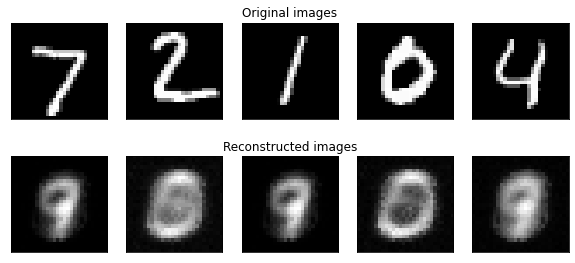


 EPOCH 2/100 	 train loss 0.058800274739041924 	 val loss 0.054634153532485165 	 csd 6.12716976320371e-05


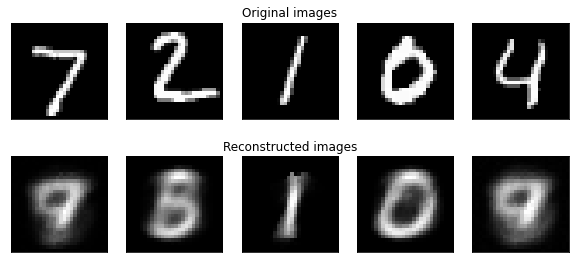


 EPOCH 3/100 	 train loss 0.05162884403641025 	 val loss 0.04929719058175882 	 csd 7.378782902378589e-05


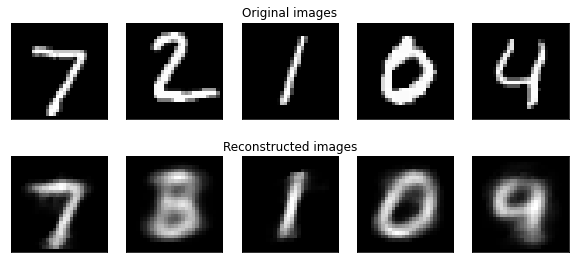


 EPOCH 4/100 	 train loss 0.04809547836581866 	 val loss 0.0471948559085528 	 csd 5.686121585313231e-05


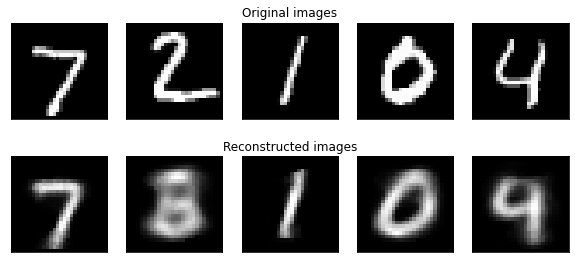


 EPOCH 5/100 	 train loss 0.04630727181211114 	 val loss 0.04582657696058353 	 csd 4.589452510117553e-05


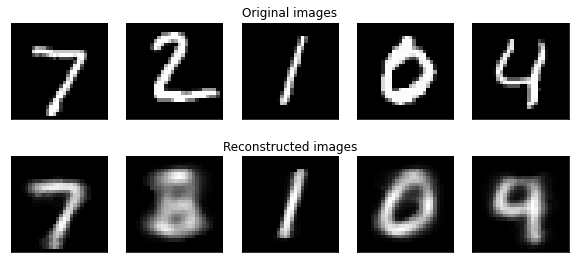


 EPOCH 6/100 	 train loss 0.045016482550029956 	 val loss 0.04470636819799741 	 csd 1.7046782886609435e-05


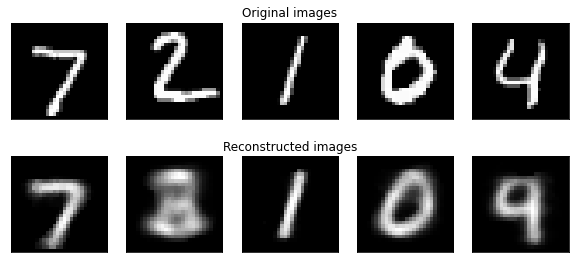


 EPOCH 7/100 	 train loss 0.04394970407399038 	 val loss 0.04377056751400232 	 csd 7.986990567587782e-06


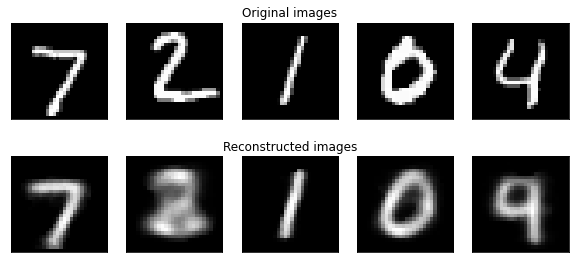


 EPOCH 8/100 	 train loss 0.04302647725368539 	 val loss 0.04290145387252172 	 csd 2.1815061700181104e-05


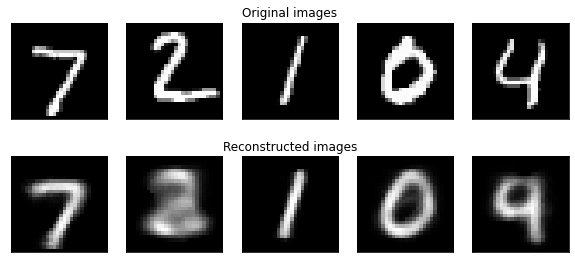


 EPOCH 9/100 	 train loss 0.04227309999987483 	 val loss 0.04218790059288343 	 csd 6.9141146923357155e-06


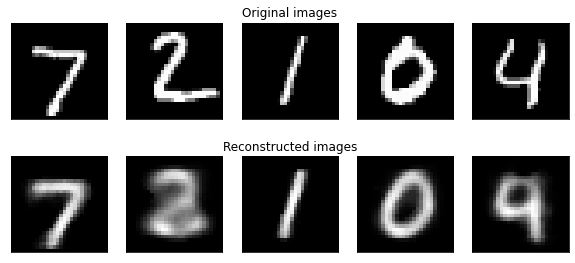


 EPOCH 10/100 	 train loss 0.04156772567269703 	 val loss 0.041672443660597004 	 csd 2.2291887944447808e-05


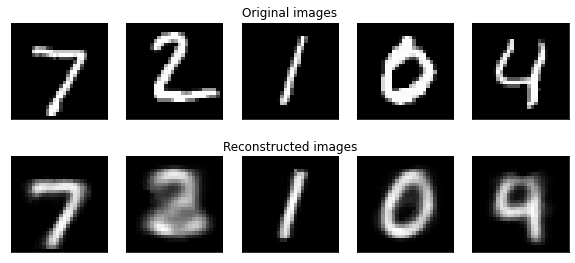


 EPOCH 11/100 	 train loss 0.041007486560071506 	 val loss 0.04105455335229635 	 csd 3.0040289857424796e-05


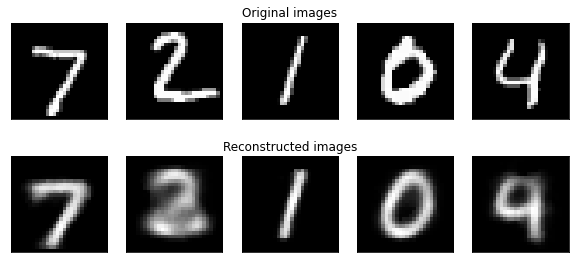


 EPOCH 12/100 	 train loss 0.040564593548576035 	 val loss 0.0407083835452795 	 csd 7.152531907195225e-06


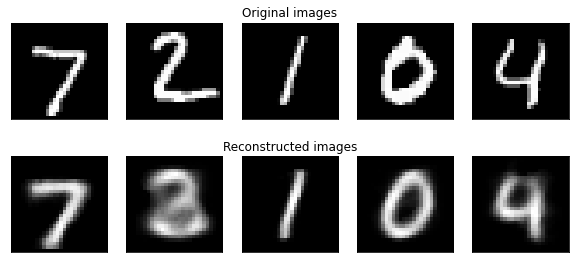


 EPOCH 13/100 	 train loss 0.04006922307113806 	 val loss 0.04024509247392416 	 csd 1.9430925021879375e-05


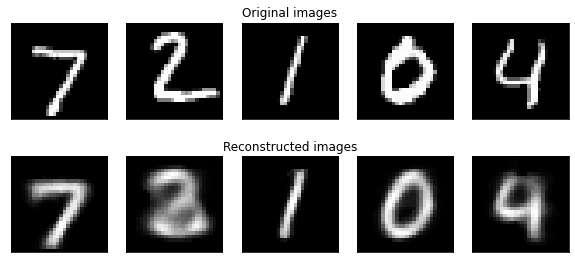


 EPOCH 14/100 	 train loss 0.03966071285928289 	 val loss 0.04003651036570469 	 csd 1.7046782886609435e-05


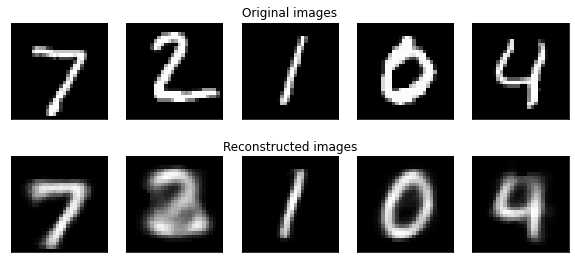


 EPOCH 15/100 	 train loss 0.03933419225116571 	 val loss 0.039667182291547455 	 csd 2.3841855067985307e-07


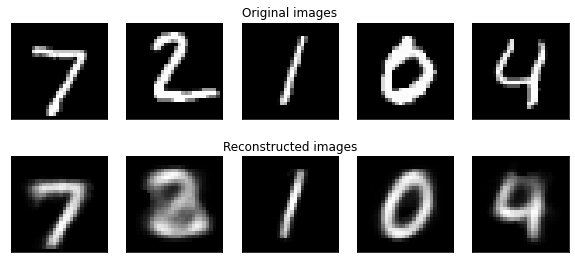


 EPOCH 16/100 	 train loss 0.03898756889005502 	 val loss 0.039457520159582295 	 csd 1.6331539882230572e-05


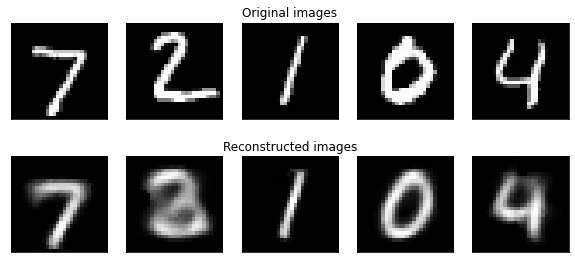


 EPOCH 17/100 	 train loss 0.03868976041364173 	 val loss 0.0391896932075421 	 csd 2.610649426060263e-05


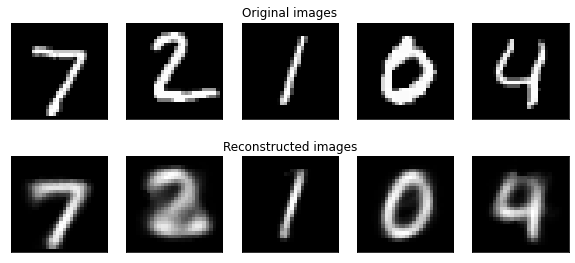


 EPOCH 18/100 	 train loss 0.038442249332244195 	 val loss 0.03908219219495853 	 csd 1.2397689715726301e-05


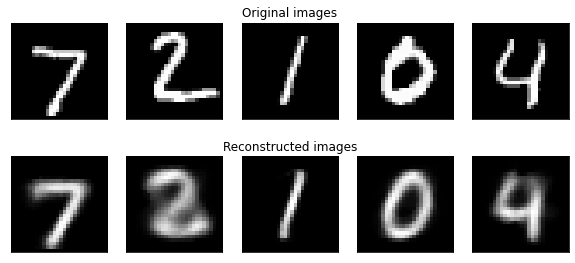


 EPOCH 19/100 	 train loss 0.03826064639724791 	 val loss 0.03886035302033027 	 csd 2.0265558760002023e-06


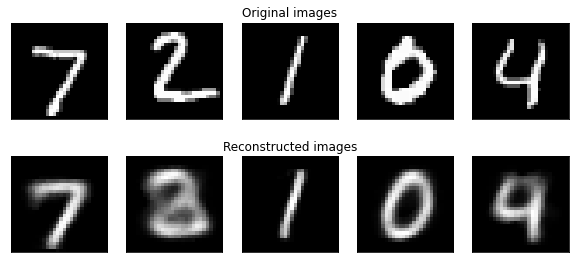


 EPOCH 20/100 	 train loss 0.03798702700684468 	 val loss 0.038512732523183026 	 csd 1.2993727978027891e-05


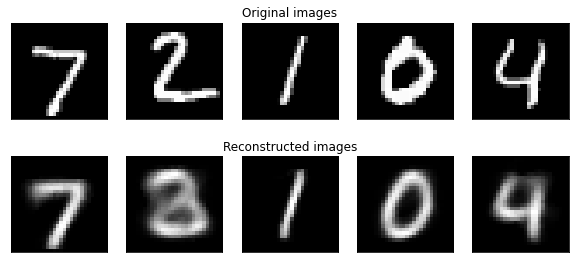


 EPOCH 21/100 	 train loss 0.037742809702952705 	 val loss 0.03836680886646112 	 csd 9.775113539944869e-06


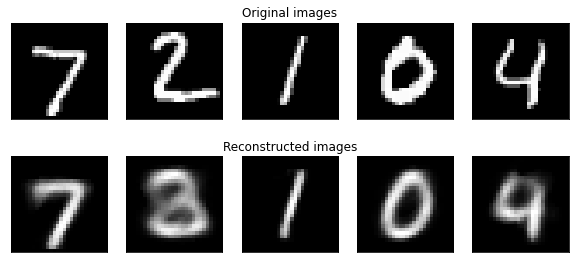


 EPOCH 22/100 	 train loss 0.03754207235760987 	 val loss 0.038121774792671204 	 csd 3.3854863431770355e-05


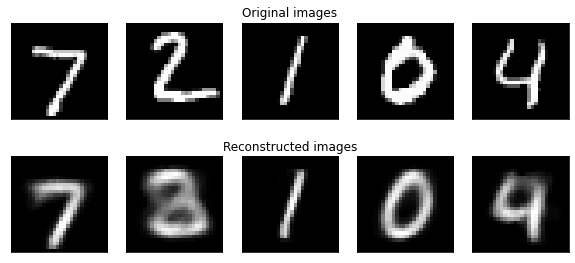


 EPOCH 23/100 	 train loss 0.037342510341356196 	 val loss 0.038082022219896317 	 csd 1.8358061424805783e-05


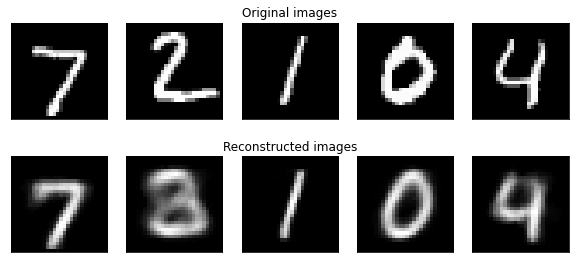


 EPOCH 24/100 	 train loss 0.03722220519557595 	 val loss 0.03796890967835983 	 csd 3.6477376852417365e-05


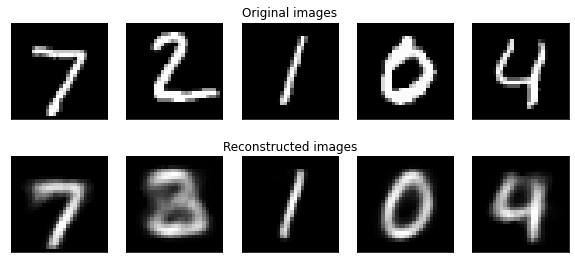


 EPOCH 25/100 	 train loss 0.03701205962958435 	 val loss 0.03776553521553675 	 csd 3.6954811548639555e-06


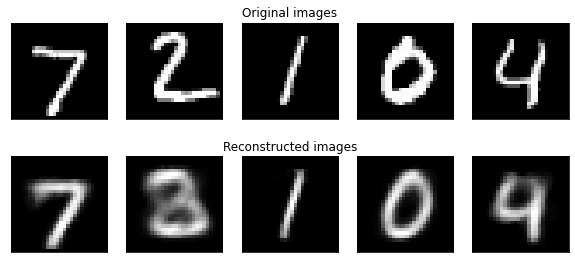


 EPOCH 26/100 	 train loss 0.03684932878240943 	 val loss 0.03764323672900597 	 csd 4.589452510117553e-05


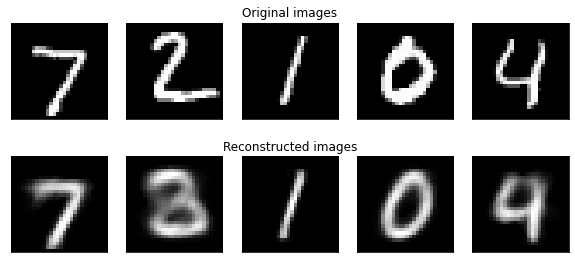


 EPOCH 27/100 	 train loss 0.036706633710612856 	 val loss 0.037673006765544415 	 csd 6.198863957251888e-06


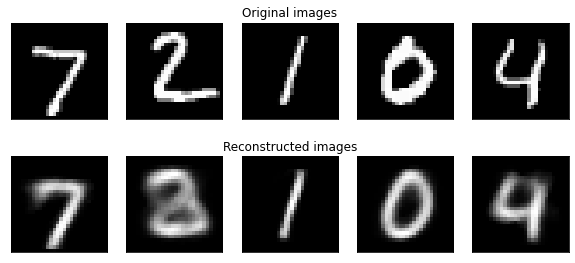


 EPOCH 28/100 	 train loss 0.036612717589984335 	 val loss 0.03747635210553805 	 csd 1.0013530300057027e-05


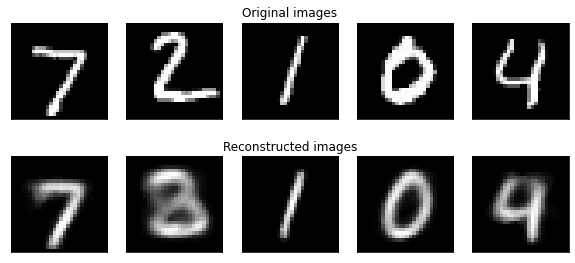


 EPOCH 29/100 	 train loss 0.0364484745853891 	 val loss 0.03740070387721062 	 csd 1.8000440832111053e-05


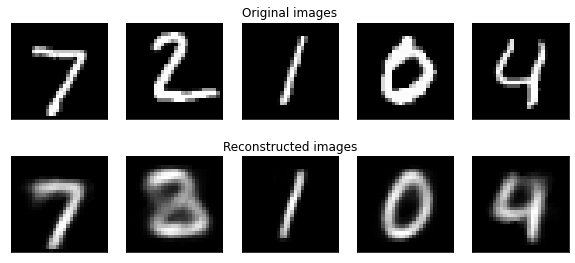


 EPOCH 30/100 	 train loss 0.03632721731749674 	 val loss 0.0372194799905022 	 csd 9.179073458653875e-06


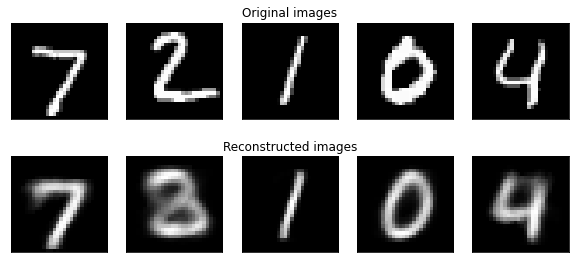


 EPOCH 31/100 	 train loss 0.03619729052297771 	 val loss 0.037130532475809254 	 csd 6.556489552167477e-06


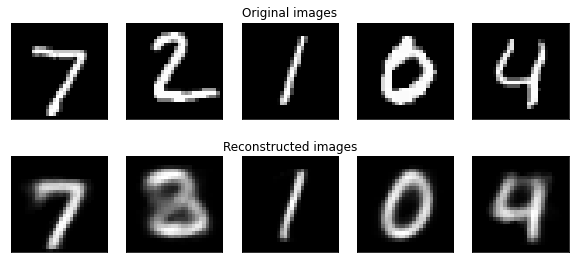


 EPOCH 32/100 	 train loss 0.03609081970838209 	 val loss 0.037229640409350395 	 csd 5.924526340095326e-05


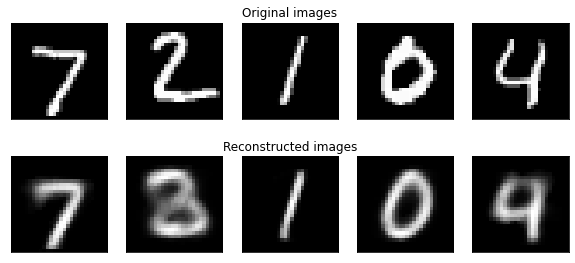


 EPOCH 33/100 	 train loss 0.036035874780888356 	 val loss 0.03700190441062053 	 csd 4.732496745418757e-05


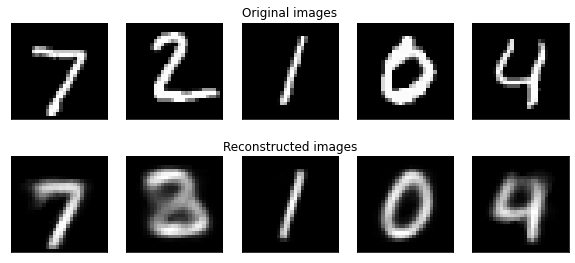


 EPOCH 34/100 	 train loss 0.03584879101254046 	 val loss 0.036981237741808094 	 csd 1.311301275563892e-06


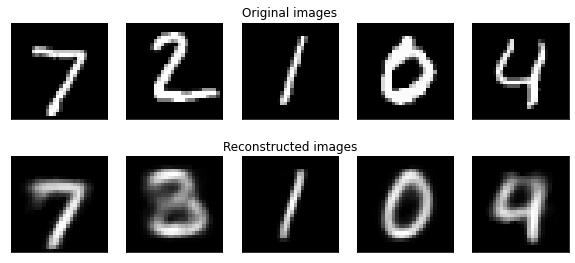


 EPOCH 35/100 	 train loss 0.03578876331448555 	 val loss 0.03684590011835098 	 csd 8.583032467868179e-06


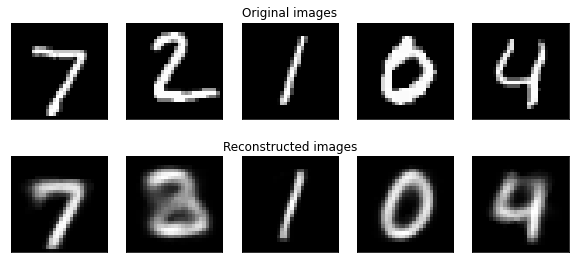


 EPOCH 36/100 	 train loss 0.035660666801656284 	 val loss 0.0367757643883427 	 csd 1.5616295058862306e-05


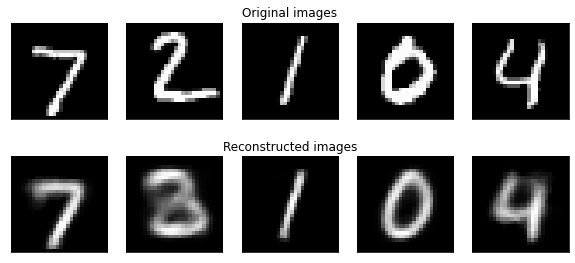


 EPOCH 37/100 	 train loss 0.03561620010683934 	 val loss 0.0369531586766243 	 csd 4.172316494077677e-06


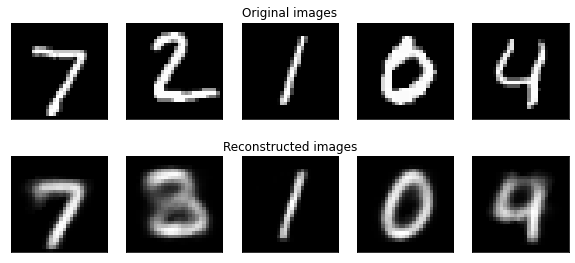


 EPOCH 38/100 	 train loss 0.03551927022635937 	 val loss 0.03666713492323955 	 csd 1.0967194612021558e-05


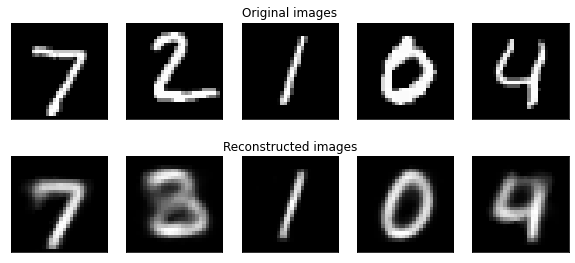


 EPOCH 39/100 	 train loss 0.0353962037867556 	 val loss 0.036721607049306236 	 csd 1.3112935448589269e-05


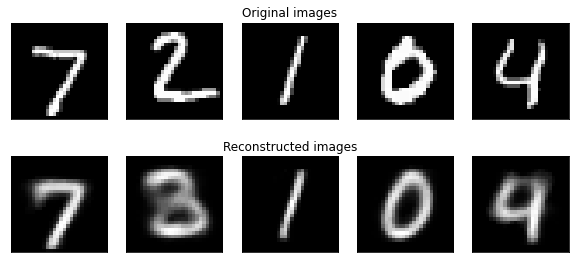


 EPOCH 40/100 	 train loss 0.03534690189796189 	 val loss 0.03648131216565768 	 csd 1.7523612768854946e-05


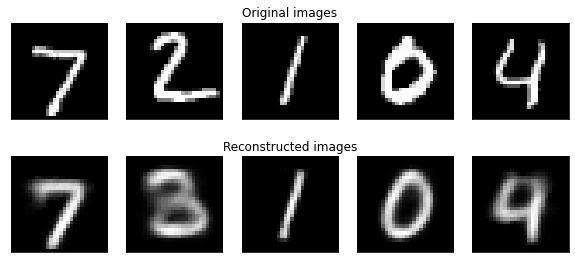


 EPOCH 41/100 	 train loss 0.03520256148961683 	 val loss 0.036616738264759384 	 csd 8.940656698541716e-06


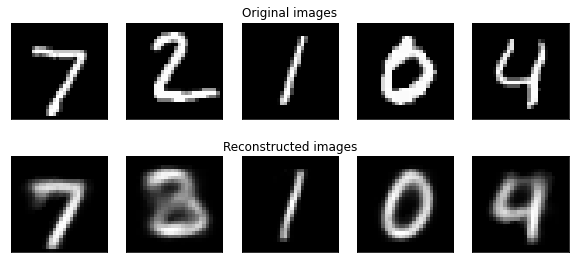


 EPOCH 42/100 	 train loss 0.035120113442341484 	 val loss 0.036489915723601975 	 csd 1.9073468138230965e-06


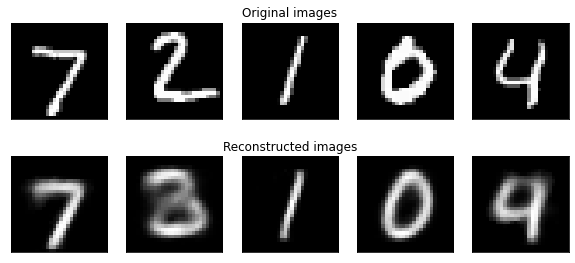


 EPOCH 43/100 	 train loss 0.03498200342680017 	 val loss 0.03629580947260062 	 csd 1.9311717551317997e-05


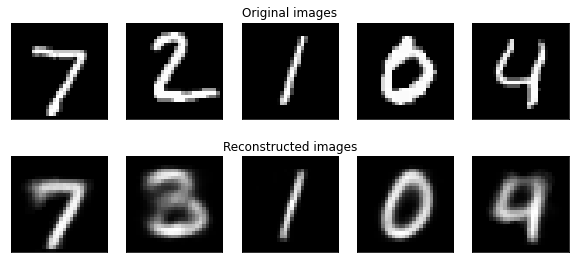


 EPOCH 44/100 	 train loss 0.03498239543599387 	 val loss 0.03644321175913016 	 csd 1.7762025890988298e-05


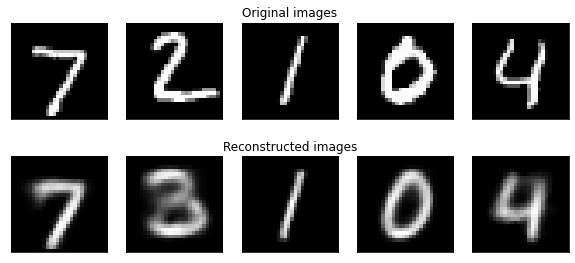


 EPOCH 45/100 	 train loss 0.03500732298319539 	 val loss 0.036448937530318894 	 csd 2.2291887944447808e-05


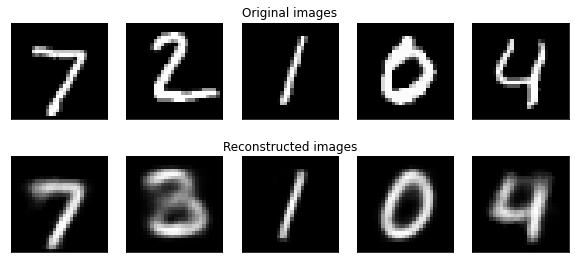


 EPOCH 46/100 	 train loss 0.034846919821575284 	 val loss 0.03625705962379774 	 csd 9.536697689327411e-06


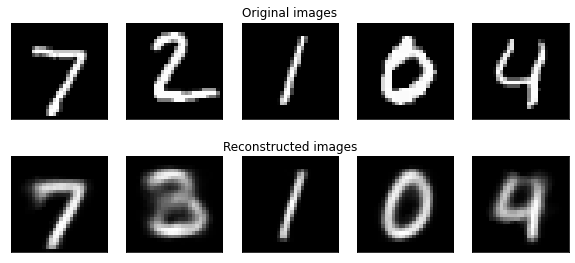


 EPOCH 47/100 	 train loss 0.03473750137103101 	 val loss 0.03626994136720896 	 csd 1.1444026313256472e-05


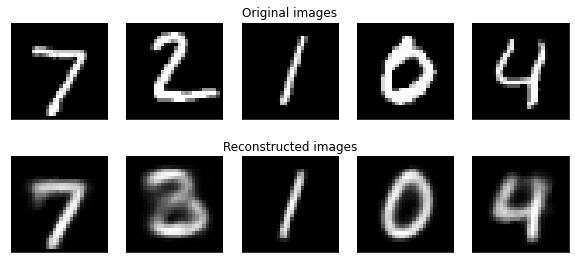


 EPOCH 48/100 	 train loss 0.03464163552659253 	 val loss 0.03632263684024414 	 csd 6.794906312279636e-06


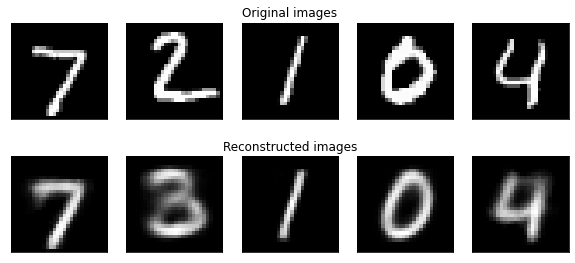


 EPOCH 49/100 	 train loss 0.03461027921487888 	 val loss 0.03604541998356581 	 csd 5.364403477869928e-06


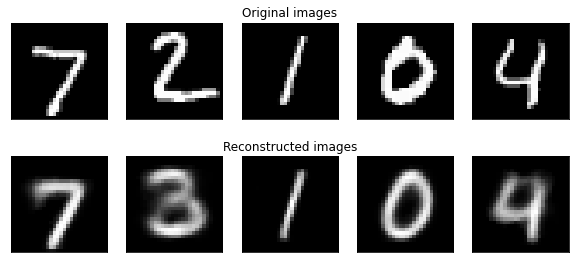


 EPOCH 50/100 	 train loss 0.034437690085421004 	 val loss 0.036017718724906445 	 csd 6.794906312279636e-06


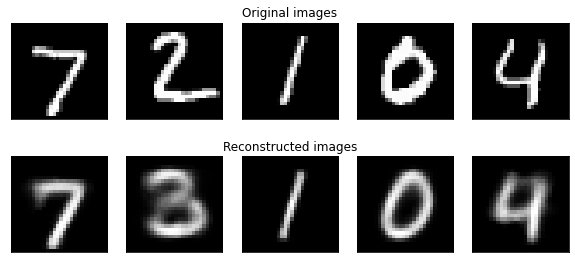


 EPOCH 51/100 	 train loss 0.0344090040307492 	 val loss 0.035993300999204315 	 csd 1.9192511899746023e-05


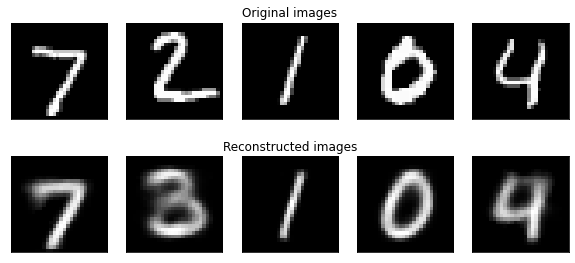


 EPOCH 52/100 	 train loss 0.03433175478130579 	 val loss 0.03595331932107607 	 csd 6.437280717364047e-06


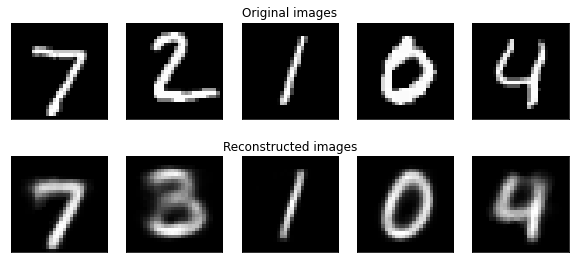


 EPOCH 53/100 	 train loss 0.03423760645091534 	 val loss 0.03599791042506695 	 csd 2.9801878554280847e-05


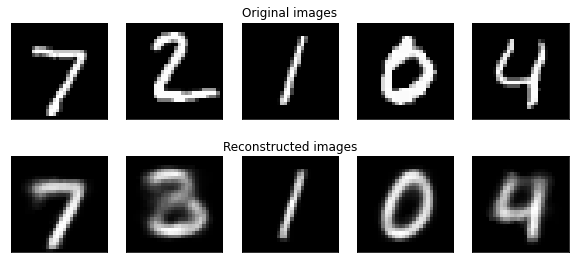


 EPOCH 54/100 	 train loss 0.03426465027344724 	 val loss 0.0358745896567901 	 csd 4.6491513785440475e-06


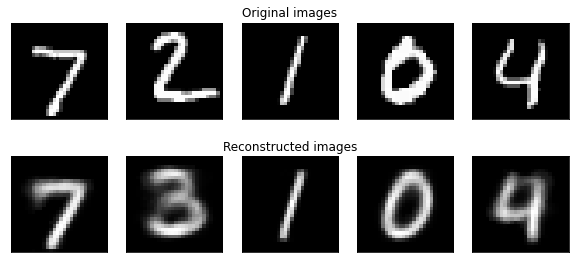


 EPOCH 55/100 	 train loss 0.03423416909451286 	 val loss 0.03579934065540632 	 csd 9.298280929215252e-06


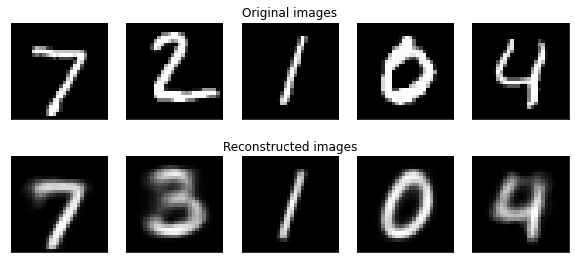


 EPOCH 56/100 	 train loss 0.034244687063619494 	 val loss 0.03590270411223173 	 csd 6.079655122448457e-06


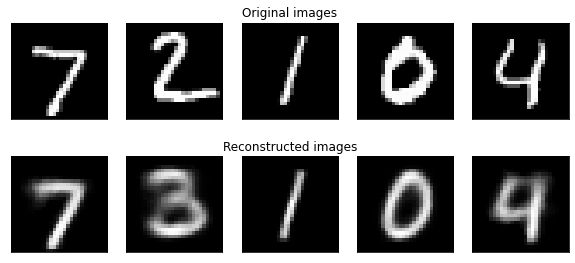


 EPOCH 57/100 	 train loss 0.03410281015870472 	 val loss 0.035767698350052037 	 csd 4.6491513785440475e-06


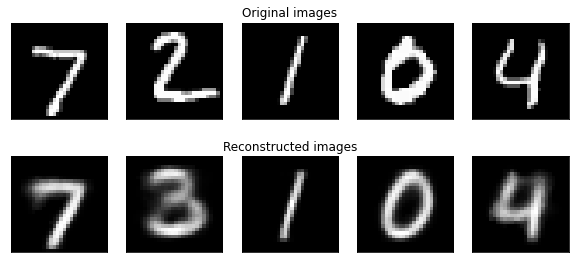


 EPOCH 58/100 	 train loss 0.034004392102360725 	 val loss 0.03577577074368795 	 csd 4.0531076592742465e-06


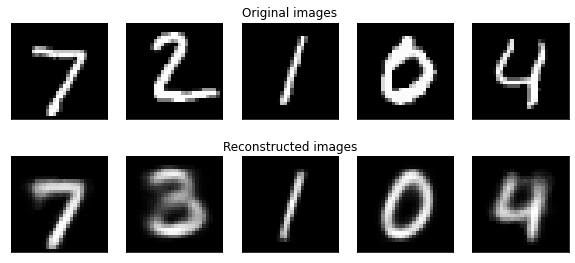


 EPOCH 59/100 	 train loss 0.03392330751133462 	 val loss 0.03579181836297115 	 csd 1.4543427823809907e-05


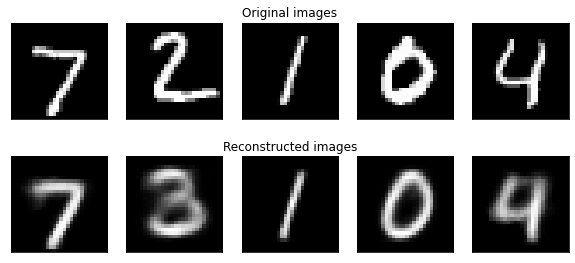


 EPOCH 60/100 	 train loss 0.033901927061378956 	 val loss 0.0357423514748613 	 csd 1.4424220353248529e-05


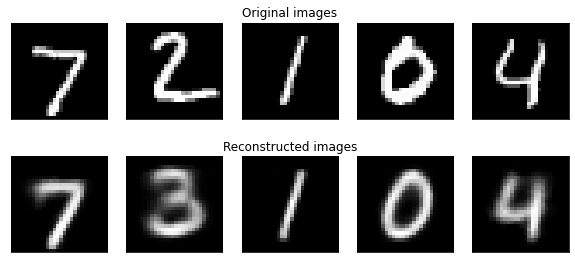


 EPOCH 61/100 	 train loss 0.03382279669555525 	 val loss 0.03564678939680258 	 csd 2.264974000354414e-06


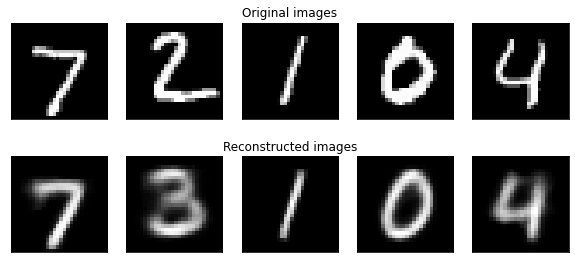


 EPOCH 62/100 	 train loss 0.033751813073952995 	 val loss 0.03568766235063473 	 csd 6.031808152329177e-05


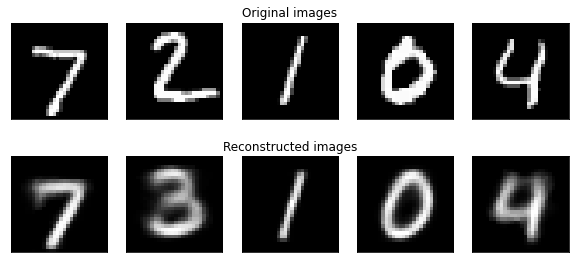


 EPOCH 63/100 	 train loss 0.03373642568476498 	 val loss 0.03560370486229658 	 csd 1.0847986231965479e-05


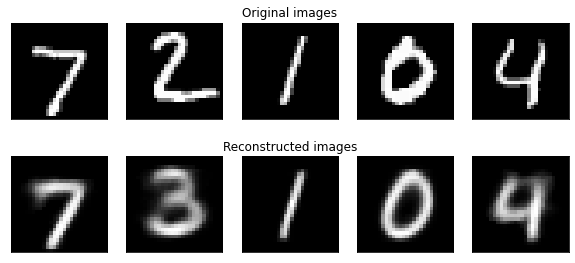


 EPOCH 64/100 	 train loss 0.03365477787641188 	 val loss 0.03565780663241943 	 csd 3.576272320060525e-06


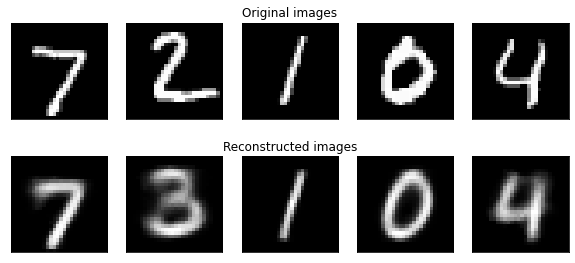


 EPOCH 65/100 	 train loss 0.03363625161970655 	 val loss 0.03555797381947438 	 csd 1.8000440832111053e-05


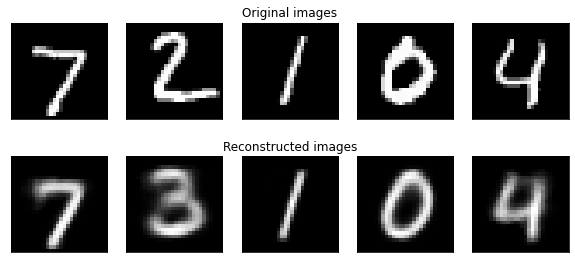


 EPOCH 66/100 	 train loss 0.03354454405295352 	 val loss 0.035635805067916713 	 csd 4.0531076592742465e-06


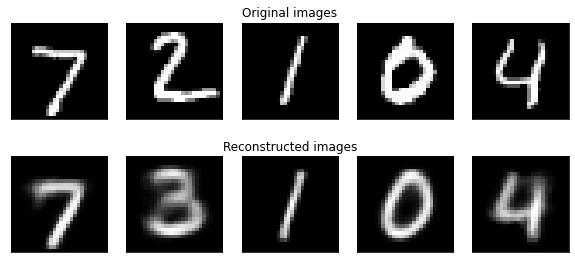


 EPOCH 67/100 	 train loss 0.03355476981960237 	 val loss 0.03562208575507005 	 csd 3.290122185717337e-05


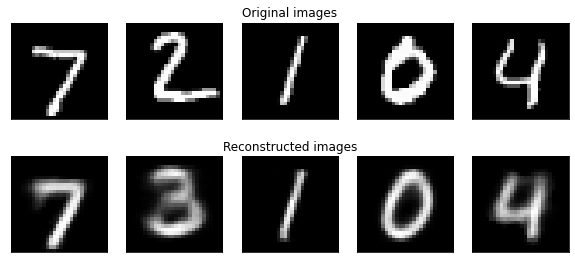


 EPOCH 68/100 	 train loss 0.03354552132077515 	 val loss 0.03551468439400196 	 csd 5.245195097813848e-06


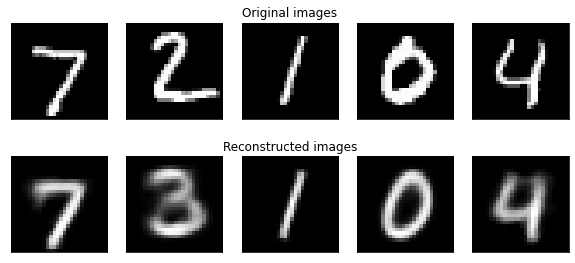


 EPOCH 69/100 	 train loss 0.033452804277961455 	 val loss 0.03553304262459278 	 csd 4.136476854910143e-05


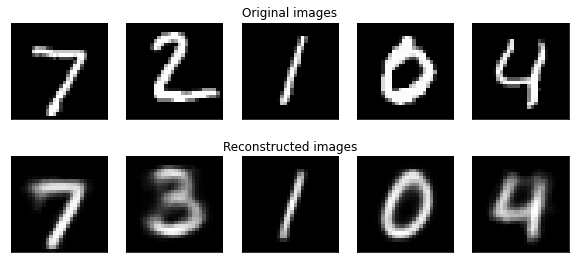


 EPOCH 70/100 	 train loss 0.03338685088480512 	 val loss 0.035500927517811455 	 csd 1.3589766240329482e-05


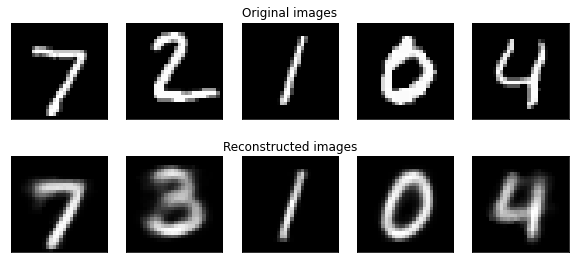


 EPOCH 71/100 	 train loss 0.03333300103743871 	 val loss 0.035690137185156345 	 csd 3.576278118089249e-07


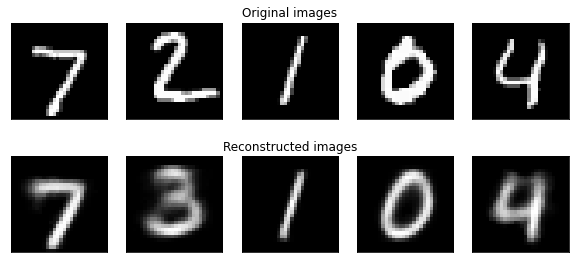


 EPOCH 72/100 	 train loss 0.03324883058667183 	 val loss 0.03542252071201801 	 csd 3.814624506048858e-05


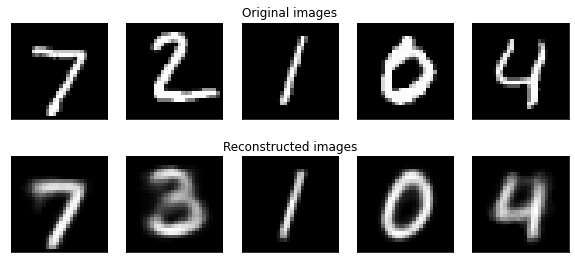


 EPOCH 73/100 	 train loss 0.03322648132840792 	 val loss 0.035633291117846966 	 csd 2.396077979938127e-05


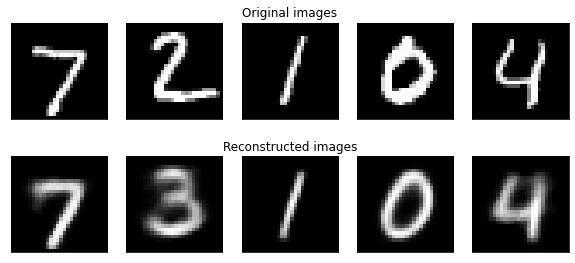


 EPOCH 74/100 	 train loss 0.033246096689254045 	 val loss 0.03551440530767044 	 csd 3.373566141817719e-05


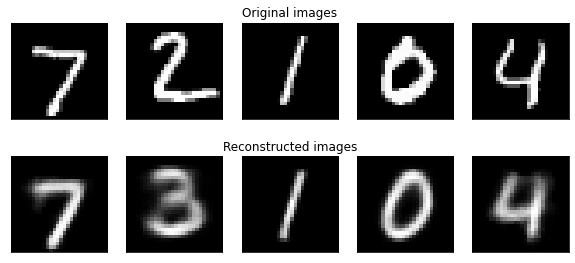


 EPOCH 75/100 	 train loss 0.03316621280585726 	 val loss 0.035449750100572906 	 csd 8.106198947643861e-06


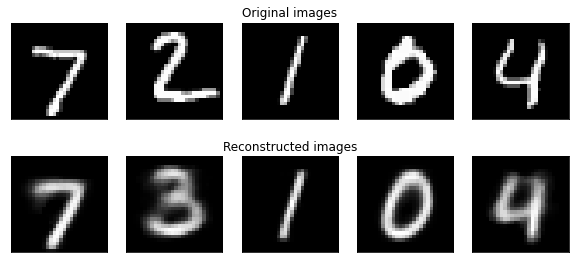


 EPOCH 76/100 	 train loss 0.033156433065111436 	 val loss 0.03561674493054549 	 csd 6.556489552167477e-06


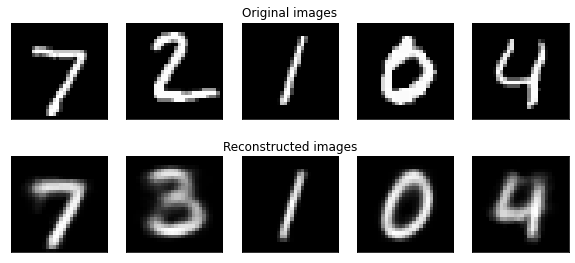


 EPOCH 77/100 	 train loss 0.03308526814604799 	 val loss 0.0353546484063069 	 csd 2.586808113846928e-05


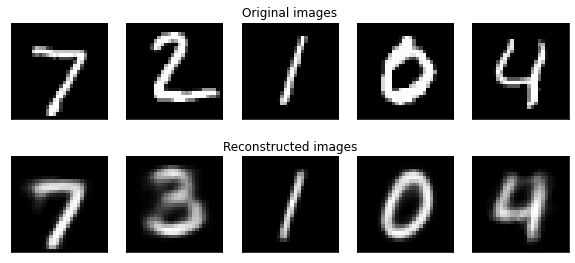


 EPOCH 78/100 	 train loss 0.03305144150120517 	 val loss 0.03544150541226069 	 csd 4.3748852476710454e-05


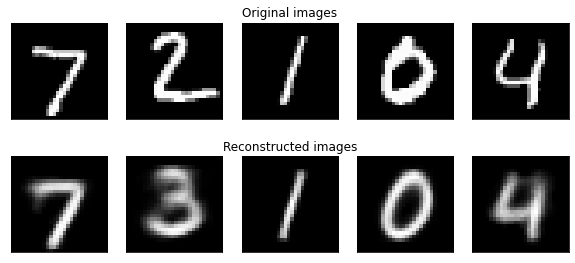


 EPOCH 79/100 	 train loss 0.032961379659051694 	 val loss 0.03541819409777721 	 csd 4.005352093372494e-05


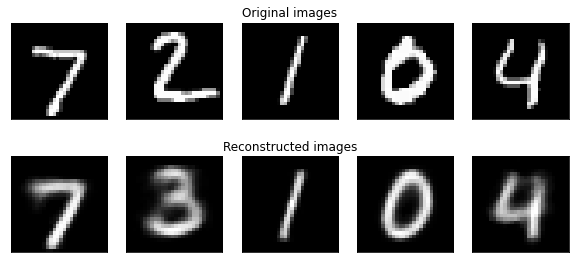


 EPOCH 80/100 	 train loss 0.03298750100657344 	 val loss 0.03541654286285242 	 csd 1.5497195136049413e-06


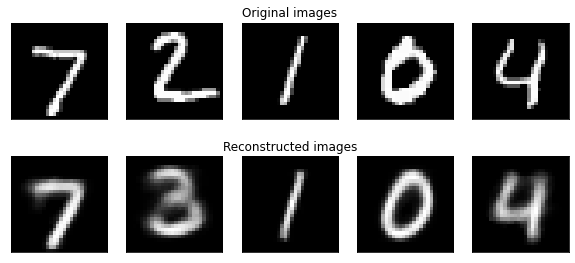


 EPOCH 81/100 	 train loss 0.03296578636703392 	 val loss 0.035380225939055286 	 csd 1.0371154530730564e-05


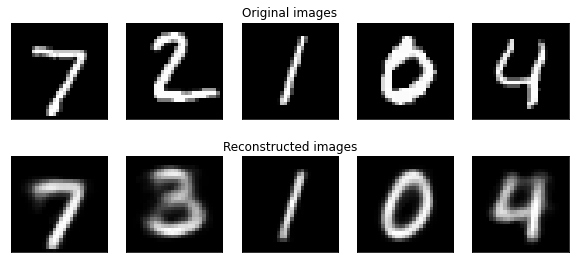


 EPOCH 82/100 	 train loss 0.03294300970931848 	 val loss 0.03541541906694571 	 csd 7.271740287251305e-06


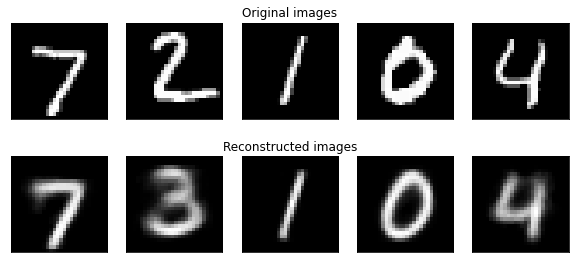


 EPOCH 83/100 	 train loss 0.032924862656121455 	 val loss 0.035347900042931236 	 csd 7.390948667307384e-06


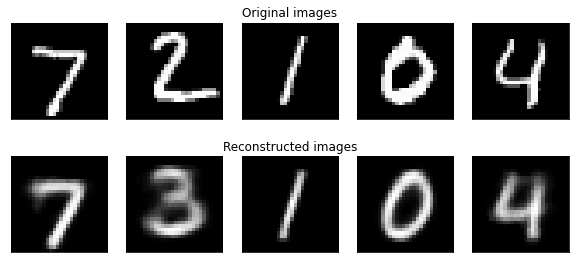


 EPOCH 84/100 	 train loss 0.03286503938337167 	 val loss 0.03547118635227283 	 csd 1.1801649634435307e-05


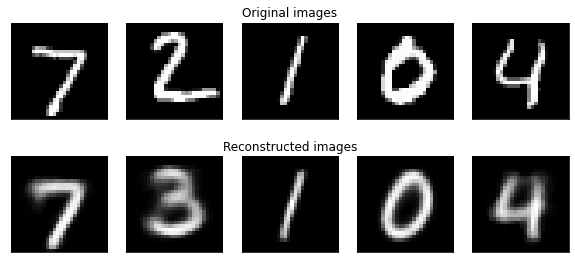


 EPOCH 85/100 	 train loss 0.03279435898487767 	 val loss 0.0353259714320302 	 csd 1.1444026313256472e-05


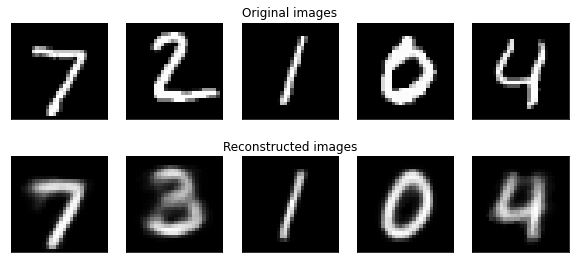


 EPOCH 86/100 	 train loss 0.03274240034321944 	 val loss 0.035323567067583404 	 csd 5.8412379075889476e-06


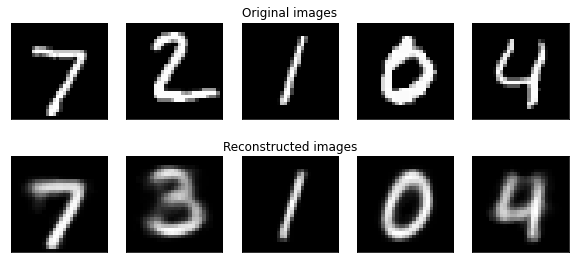


 EPOCH 87/100 	 train loss 0.03280221515645584 	 val loss 0.035614926678438984 	 csd 2.264974000354414e-06


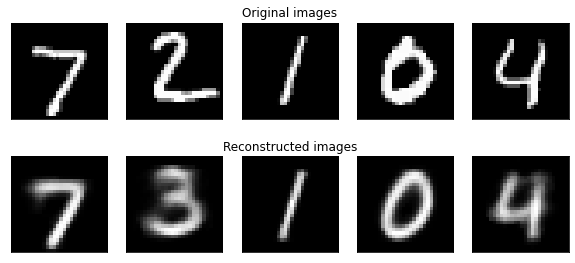


 EPOCH 88/100 	 train loss 0.03280667611397803 	 val loss 0.03542711058010658 	 csd 5.722029527532868e-06


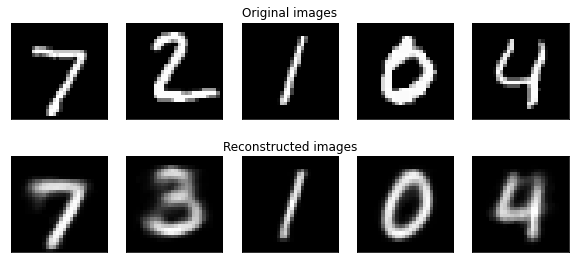


 EPOCH 89/100 	 train loss 0.032752097894748054 	 val loss 0.03550150773177544 	 csd 1.3470558769768104e-05


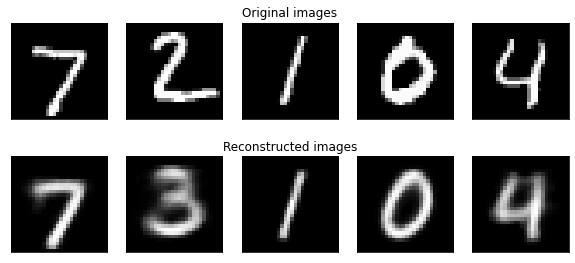


 EPOCH 90/100 	 train loss 0.03269904991611838 	 val loss 0.03527181129902601 	 csd 1.585470999998506e-05


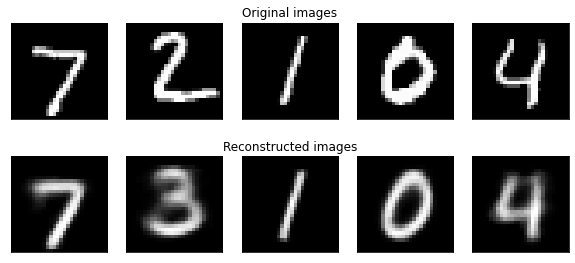


 EPOCH 91/100 	 train loss 0.0326233416950951 	 val loss 0.03537859860807657 	 csd 1.6689286894688848e-06


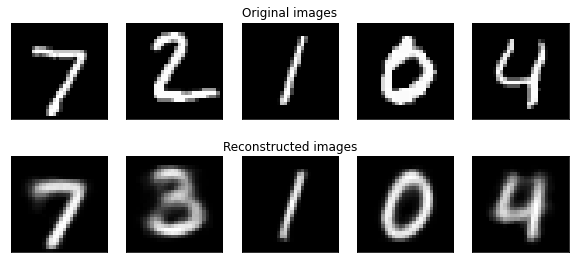


 EPOCH 92/100 	 train loss 0.032645245625947915 	 val loss 0.0352755036825935 	 csd 3.814689989667386e-06


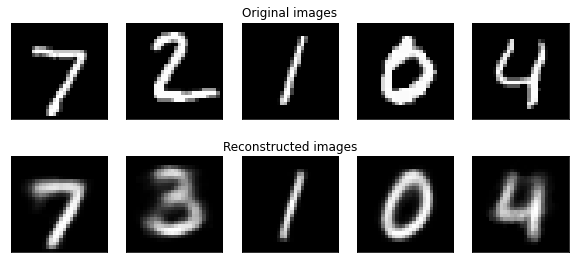


 EPOCH 93/100 	 train loss 0.032576376805081964 	 val loss 0.03531642133990923 	 csd 5.960462772236497e-07


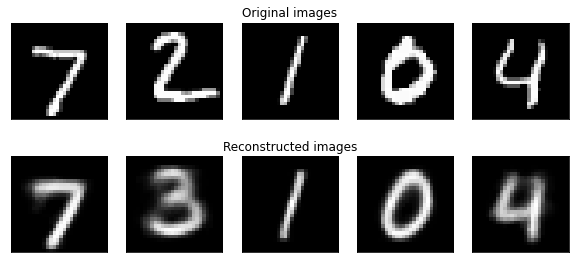


 EPOCH 94/100 	 train loss 0.03254287030237416 	 val loss 0.035305244848132133 	 csd 5.602820692729438e-06


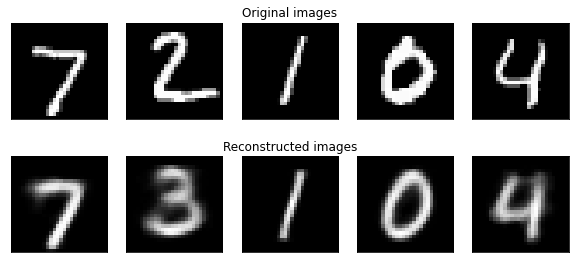


 EPOCH 95/100 	 train loss 0.03252787507760028 	 val loss 0.03526824122915665 	 csd 3.933898824470816e-06


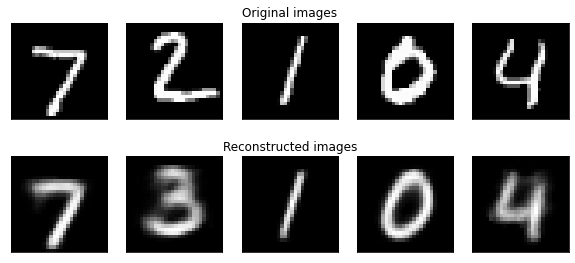


 EPOCH 96/100 	 train loss 0.0325029285158962 	 val loss 0.03534324808667103 	 csd 2.109982233378105e-05


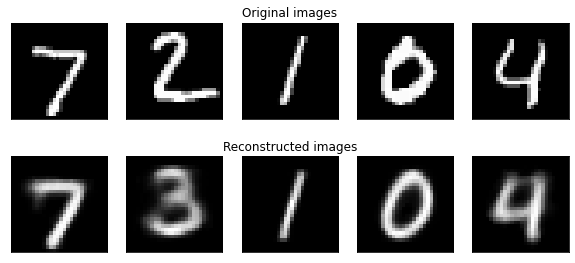


 EPOCH 97/100 	 train loss 0.0324566886605074 	 val loss 0.03540173607567946 	 csd 1.5497195136049413e-06


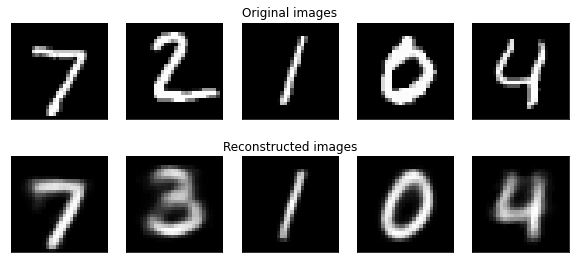


 EPOCH 98/100 	 train loss 0.03243740896383921 	 val loss 0.03518063730249802 	 csd 8.106198947643861e-06


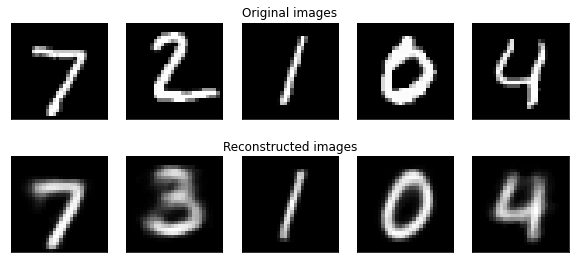


 EPOCH 99/100 	 train loss 0.03237423199849824 	 val loss 0.035265459989507995 	 csd 2.1815061700181104e-05


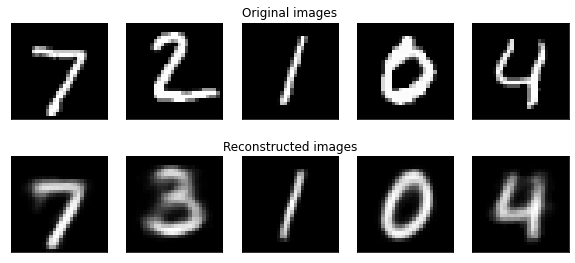


 EPOCH 100/100 	 train loss 0.032351855848294996 	 val loss 0.035291531744102635 	 csd 8.940656698541716e-06


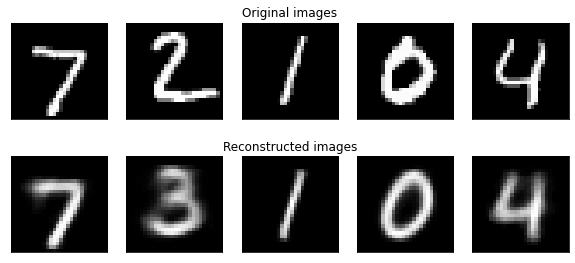

In [ ]:
num_epochs = 100
train_losses2 = []
val_losses2 = []
for epoch in range(num_epochs):
    train_loss = train_epoch(ae2,device,train_dataloader,optim)
    val_loss = test_epoch(ae2,device,val_dataloader)
    train_losses2.append(train_loss)
    val_losses2.append(val_loss)
    print('\n EPOCH {}/{} \t train loss {} \t val loss {} \t csd {}'.format(epoch + 1, num_epochs,train_loss,val_loss, ae2.encoder.csd))
    plot_ae_outputs(ae2.encoder,ae2.decoder,n=5)

In [ ]:
encoded_samples2 = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    ae2.eval()
    with torch.no_grad():
        encoded_img  = ae2.encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples2.append(encoded_sample)
    
encoded_samples2 = pd.DataFrame(encoded_samples2)
encoded_samples2

  0%|          | 0/10000 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1795: UserWarning:

nn.functional.tanh is deprecated. Use torch.tanh instead.

100%|██████████| 10000/10000 [00:32<00:00, 311.19it/s]


,Enc. Variable 0,Enc. Variable 1,label
0,-1.530731,2.857551,"tensor(7, dtype=torch.uint8)"
1,1.803805,-1.647185,"tensor(2, dtype=torch.uint8)"
2,-4.978888,-1.102351,"tensor(1, dtype=torch.uint8)"
3,2.941796,-0.344296,"tensor(0, dtype=torch.uint8)"
4,0.526655,1.259183,"tensor(4, dtype=torch.uint8)"
...,...,...,...
9995,0.800332,-1.126080,"tensor(2, dtype=torch.uint8)"
9996,1.694589,-4.130653,"tensor(3, dtype=torch.uint8)"
9997,-1.178759,1.362688,"tensor(4, dtype=torch.uint8)"
9998,-1.246975,-0.376364,"tensor(5, dtype=torch.uint8)"


In [ ]:
# kernel_size = 100, lambda = 1 epochs = 100  change gaussian func
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 0.1, lambda = 1 epochs = 150 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 1, lambda = 1 epochs = 150 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 100, lambda = 3 epochs = 150 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 100, lambda = 2 epochs = 160 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 100, lambda = 2 epochs = 10 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 10, lambda = 10 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 100, lambda = 10 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 100, lambda = 2
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 100, lambda = 1 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 100, lambda = 0.5 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 100, lambda = 0.01 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 5, lambda = 0.1 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 100, lambda = 0.1 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 50, lambda = 0.1 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 30, lambda = 0.1 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 1, lambda = 0.1 
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 20, lambda = 0.1 == 10, 0.05
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 10, lambda = 0.05
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 10, lambda = 0.5
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 10, lambda = 0.1
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
# kernel_size = 10, lambda = 1
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
px.scatter(encoded_samples2, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples2.label.astype(str), opacity=0.7)

In [ ]:
def plot_reconstructed_by_gaussian_mix_sort_2d(decoder, n=10):
  plt.figure(figsize=(20, 8.5))
  w = 28
  img = np.zeros((n*w, n*w))
  g = Gaussian_mix_2d(10, 2)
  g = g.sample(([n**2]))
  # s = swiss_sorted_2d(n**2)
  # for i in range(n):
    # for j in range(n):
      # x, y, z = s[i][j]
      # x, z = s[i][j]
      # m = torch.Tensor([x, y, z]).to(device)
  i = 0
  print(g.shape)
  for j, (x, z) in enumerate(g):
    if j != 0:
      if j % 10 == 0:
        i += 1
    m = torch.Tensor([x, z]).to(device)
    x_hat = decoder(m)
    x_hat = x_hat.reshape(28, 28).to('cpu').detach().numpy()
    # print(i, j)
    img[(n-1-i)*w:(n-1-i+1)*w, (j%10)*w:((j%10)+1)*w] = x_hat
  plt.imshow(img, cmap='gist_gray')

torch.Size([100, 2])


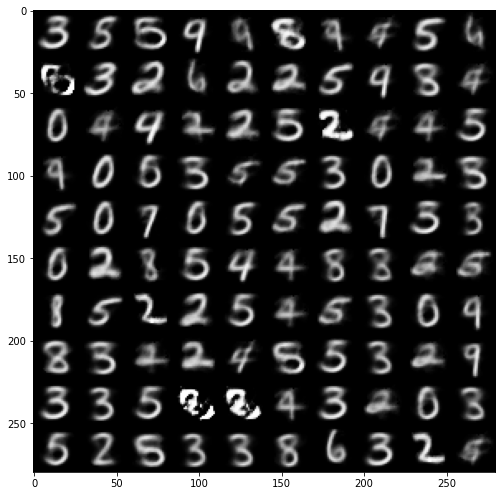

In [ ]:
plot_reconstructed_by_gaussian_mix_sort_2d(ae2.decoder, n=10)